## Celligner 2: trials

### setting up

In [1]:
from genepy.utils import helper as h

# to comment in your case
from taigapy import TaigaClient
tc = TaigaClient()

from celligner2.dataset import anndata
import pandas as pd
# to comment in your case
from depmapomics import tracker as track

from collections import Counter

#autoreload
%load_ext autoreload
%autoreload 2
#output
from bokeh.plotting import output_notebook
output_notebook()
from anndata import AnnData, read_h5ad

import scanpy as sc
import torch
import matplotlib.pyplot as plt
import numpy as np
import gdown

import celligner2

Loading BokehJS ...

In [93]:
sc.settings.set_figure_params(dpi=500, frameon=False)
sc.set_figure_params(dpi=500)
sc.set_figure_params(figsize=(18, 18))
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

In [3]:
dataset = read_h5ad("temp/celligner_multi_v2.h5ad.gz")

In [4]:
dataset = dataset[:, ((dataset.X==0).sum(0)<20_000)]

In [7]:
loc = np.argsort(np.var(dataset.X, 0))[-5000:]
dataset = AnnData(dataset.X[:,loc], dataset.obs, dataset.var.iloc[loc])

In [8]:
tosend = dataset[dataset.obs.dataset.isin(['tcga', 'gtex', 'ccle'])].copy()

In [58]:
cl2 = celligner2.CELLIGNER2(
    adata=tosend,
    condition_keys=['dataset'],
    predictor_keys=['lineage', 'age', "sex"],
    hidden_layer_sizes=[256, 128],
    classifier_hidden_layer_sizes=[32, 64],
    use_mmd = True,
    latent_dim=16,
    beta=500,
    betaclass=0.8,
    apply_log=False,
    #mmd_on='y1'
    #recon_loss="mse",
)
cl2n.train(
    n_epochs=300,
    alpha_epoch_anneal=200,
    cell_type_key='lineage',
    early_stopping_kwargs= {
        "early_stopping_metric": "val_unweighted_loss",
        "threshold": 0,
        "patience": 20,
        "reduce_lr": True,
        "lr_patience": 13,
        "lr_factor": 0.1,
    },
    alpha_kl=0.001,
    train_frac=0.8,
    batch_size=200,
    #monitor_only_val=False,
    n_workers=8,
    min_weight=0.000001,
)

main dataset not in conditions, removing..

INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 5000 256 2
	Hidden Layer 1 in/out: 256 128
	Mean/Var Layer in/out: 128 16
Classifier Architecture:
	First Layer in/out:  16 32
	Hidden Layer 1 in/out: 32 64
	Output Layer in/out:  64 42 

Decoder Architecture:
	First Layer in, out and cond:  16 128 2
	Hidden Layer 1 in/out: 128 256
	Output Layer in/out:  256 5000 



/home/jeremie/celligner2/celligner2/dataset/celligner2/anndata.py:53: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.goodloc = torch.tensor(goodloc, dtype=torch.bool)


 |██------------------| 13.3%  - val_loss: 38608.3787802419 - val_recon_loss: 38416.9372479839 - val_kl_loss: 99.7948020197 - val_class_ce_loss: 98.1902308618 - val_mmd_loss: 93.232400955783
ADJUSTED LR
 |████----------------| 20.7%  - val_loss: 38433.4816028226 - val_recon_loss: 38064.3610131048 - val_kl_loss: 99.7767075569 - val_class_ce_loss: 79.7136087629 - val_mmd_loss: 289.3755827873
ADJUSTED LR
 |████----------------| 23.0%  - val_loss: 38473.9049899194 - val_recon_loss: 38112.8562247984 - val_kl_loss: 99.7965565343 - val_class_ce_loss: 77.7850197907 - val_mmd_loss: 283.2287179270
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 47


In [54]:
cl2n = celligner2.CELLIGNER2(
    adata=tosend,
    condition_keys=['dataset'],
    predictor_keys=['lineage', 'age', "sex"],
    hidden_layer_sizes=[1024, 512, 256],
    classifier_hidden_layer_sizes=[32, 64],
    use_mmd = True,
    latent_dim=26,
    beta=100,
    betaclass=0.8,
    apply_log=False,
    miss='u',
    #mmd_on='y1'
    #recon_loss="mse",
)
cl2n.train(
    n_epochs=500,
    alpha_epoch_anneal=200,
    cell_type_key='lineage',
    early_stopping_kwargs= {
        "early_stopping_metric": "val_unweighted_loss",
        "threshold": 0,
        "patience": 40,
        "reduce_lr": True,
        "lr_patience": 13,
        "lr_factor": 0.1,
    },
    alpha_kl=0.001,
    train_frac=0.8,
    batch_size=200,
    #monitor_only_val=False,
    n_workers=8,
    min_weight=0.000001,
)

main dataset not in conditions, removing..

INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 5000 1024 3
	Hidden Layer 1 in/out: 1024 512
	Hidden Layer 2 in/out: 512 256
	Mean/Var Layer in/out: 256 26
Classifier Architecture:
	First Layer in/out:  26 32
	Hidden Layer 1 in/out: 32 64
	Output Layer in/out:  64 41 

Decoder Architecture:
	First Layer in, out and cond:  26 256 3
	Hidden Layer 1 in/out: 256 512
	Hidden Layer 2 in/out: 512 1024
	Output Layer in/out:  1024 5000 



/home/jeremie/celligner2/celligner2/dataset/celligner2/anndata.py:53: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.goodloc = torch.tensor(goodloc, dtype=torch.bool)


Therefore integer value of those labels is set to -1
Therefore integer value of those labels is set to -1
Therefore integer value of those labels is set to -1
Therefore integer value of those labels is set to -1
Therefore integer value of those labels is set to -1
Therefore integer value of those labels is set to -1
 |███-----------------| 19.8%  - val_loss: 39316.9329833984 - val_recon_loss: 38943.8198242188 - val_kl_loss: 108.0529816151 - val_class_ce_loss: 140.7573033571 - val_mmd_loss: 232.3013696671
ADJUSTED LR
 |█████---------------| 25.6%  - val_loss: 39112.7425537109 - val_recon_loss: 38735.7606201172 - val_kl_loss: 107.9047331810 - val_class_ce_loss: 133.5965580940 - val_mmd_loss: 243.3153457642
ADJUSTED LR
 |█████---------------| 29.0%  - val_loss: 39092.4697265625 - val_recon_loss: 38730.1094970703 - val_kl_loss: 107.8935456276 - val_class_ce_loss: 135.1693520546 - val_mmd_loss: 227.1130437851
ADJUSTED LR
 |██████--------------| 32.0%  - val_loss: 39071.2528076172 - val_reco

tential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
 |███-----------------| 18.0%  - val_loss: 8799.0014648438 - val_recon_loss: 5521.0173068576 - val_kl_loss: 65.7575039334 - val_class_ce_loss: 1196.2940425166 - val_mmd_loss: 2081.6724712231
ADJUSTED LR
 |████----------------| 20.3%  - val_loss: 9149.5041775174 - val_recon_loss: 5515.7696397569 - val_kl_loss: 65.7672825566 - val_class_ce_loss: 1195.6772664388 - val_mmd_loss: 2438.0377027724
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 39

In [16]:
from celligner2 import plotting as pl

In [102]:
evaluator = pl.CELLIGNER2_EVAL(cl2s)

NameError: name 'cl2s' is not defined

/home/jeremie/miniconda3/envs/gae/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'lineage_pred' as categorical
/home/jeremie/miniconda3/envs/gae/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'age_pred' as categorical
/home/jeremie/miniconda3/envs/gae/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed

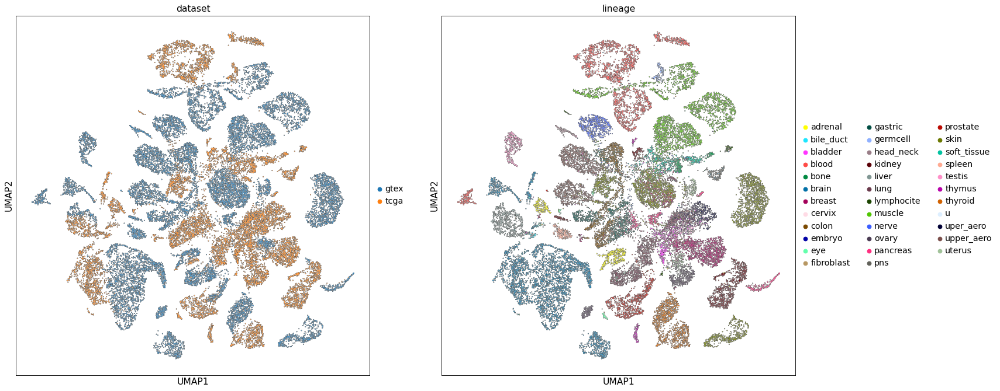

In [60]:
evaluator.plot_latent(umap_kwargs=dict( 
                            n_components=2,
                            min_dist=.5,
                            alpha=1,
                            spread=1,
                            random_state=None),
                    color=['dataset','lineage'],
                    projection="2d",
                    n_neighbors = 8,
                    #rerun=False,
                    add_outline = True,
                    #size = [30 if val != 'tcga' else 10 for val in evaluator.adata_latent.obs['dataset']]
                     )

In [55]:
evaluator = pl.CELLIGNER2_EVAL(cl2n)

In [60]:
evaluator.plot_latent(umap_kwargs=dict( 
                            n_components=2,
                            min_dist=.5,
                            alpha=1,
                            spread=1,
                            random_state=None),
                    color=['dataset','lineage'],
                    projection="2d",
                    n_neighbors = 8,
                    rerun=False,
                    use_genepy=True,
                    add_outline = True,
                    size = [30 if val == 'ccle' else 10 for val in evaluator.adata_latent.obs['dataset']]
                     )

TypeError: scatter() missing 1 required positional argument: 'data'

In [61]:
from genepy.utils import plot

In [63]:
evaluator.adata_latent

AnnData object with n_obs × n_vars = 31667 × 26
    obs: 'dataset', 'lineage', 'age', 'sex', 'lineage_pred', 'age_pred', 'sex_pred', 'leiden'
    uns: 'neighbors', 'leiden', 'umap', 'dataset_colors', 'lineage_colors'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [80]:
from bokeh.palettes import Category20_20, Set3_12, Accent8

In [81]:
color = Category20_20+ Set3_12+ Accent8

In [78]:
len(set(evaluator.adata_latent.obs['lineage']))

36

In [ ]:
evaluator.plot_latent(umap_kwargs=dict( 
                            n_components=2,
                            min_dist=.5,
                            alpha=1,
                            spread=1,
                            random_state=None),
                    color=['lineage','dataset', 'sex', 'age'],
                    use_genepy=True
                    projection="2d",
                    n_neighbors = 8,
                    #rerun=False,
                    importance = [0 if val == 'ccle' else 1 for val in evaluator.adata_latent.obs['dataset']],
                    shape = evaluator.adata_latent.obs['dataset'].tolist(),
                    alpha=0.6,
                    radii=5,
                    colprovided=True,
                    folder='temp_plot'
                     )

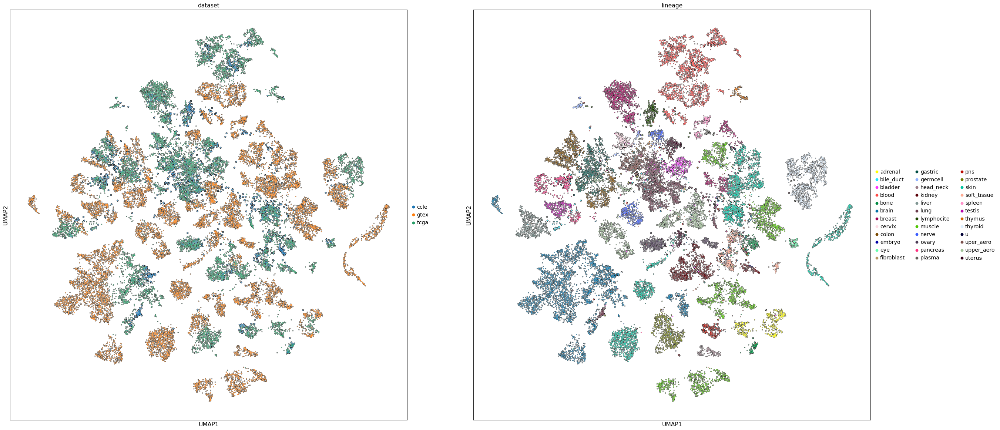

In [57]:
evaluator.plot_latent(umap_kwargs=dict( 
                            n_components=2,
                            min_dist=.5,
                            alpha=1,
                            spread=1,
                            random_state=None),
                    color=['dataset','lineage'],
                    projection="2d",
                    n_neighbors = 8,
                    #rerun=False,
                    add_outline = True,
                    size = [30 if val == 'ccle' else 10 for val in evaluator.adata_latent.obs['dataset']]
                     )

In [105]:
sc.settings.set_figure_params(dpi=500, frameon=False)
sc.set_figure_params(dpi=500)
sc.set_figure_params(figsize=(20, 20))
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

In [118]:
evaluator.adata_latent.obs[['lineage', 'sex', 'age']] = evaluator.model.adata.obs[['lineage', 'sex', 'age']]

### do we have lots of variance?

In [19]:
import umap
import umap.plot

In [ ]:
red = umap.UMAP(densmap=True, dens_lambda=0.1).fit(evaluator.adata_latent.X)

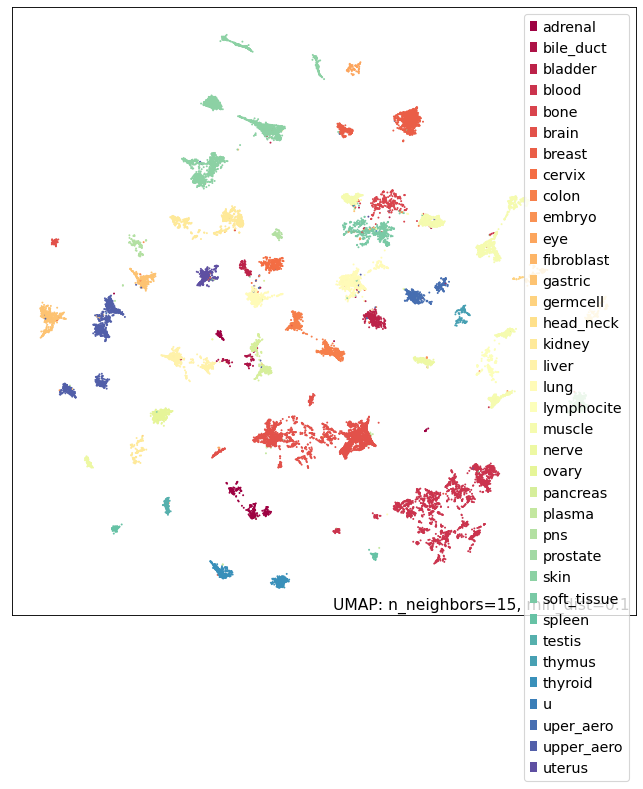

In [29]:
p = umap.plot.points(red, labels=evaluator.adata_latent.obs.lineage)
umap.plot.show(p)

### what about other annotation?

In [31]:
evaluator.adata_latent.obs['disease_type'] = tosend.obs.disease_type

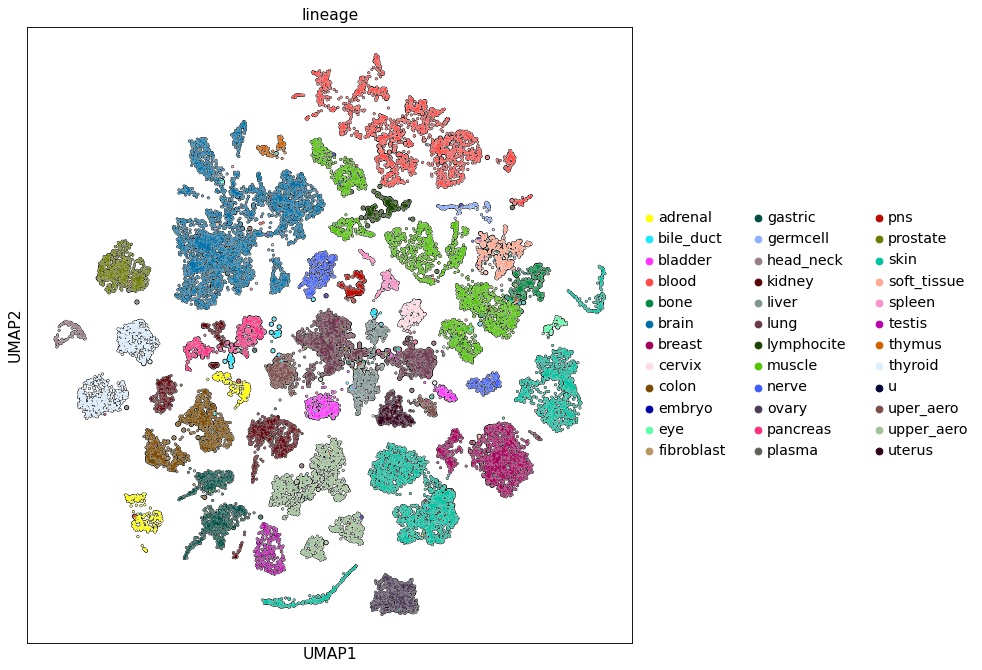

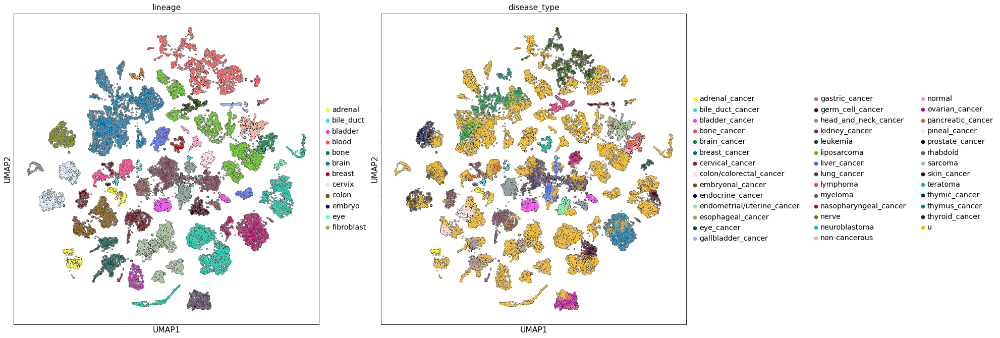

In [33]:
evaluator.plot_latent(umap_kwargs=dict( 
                            n_components=2,
                            min_dist=.5,
                            alpha=1,
                            spread=1,
                            random_state=None),
                    color=['lineage','disease_type'],
                    projection="2d",
                    n_neighbors = 8,
                    rerun=False,
                    add_outline = True,
                    size = [30 if val == 'ccle' else 10 for val in evaluator.adata_latent.obs['dataset']]
                     )

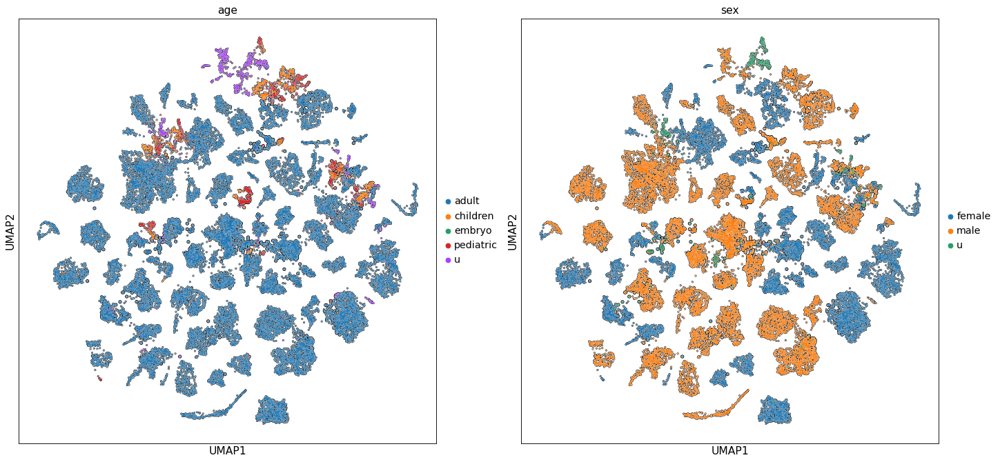

In [34]:
evaluator.plot_latent(umap_kwargs=dict( 
                            n_components=2,
                            min_dist=.5,
                            alpha=1,
                            spread=1,
                            random_state=None),
                    color=['age','sex'],
                    projection="2d",
                    n_neighbors = 8,
                    rerun=False,
                    add_outline = True,
                    size = [30 if val == 'ccle' else 10 for val in evaluator.adata_latent.obs['dataset']]
                     )

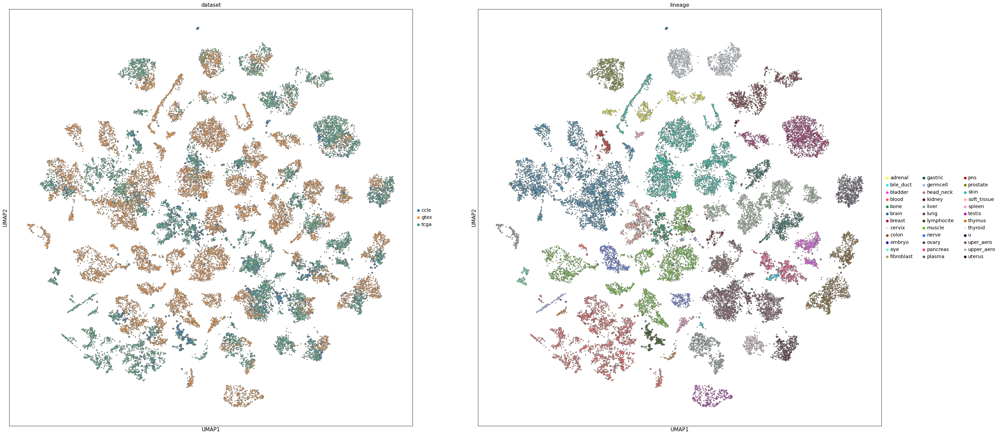

In [106]:
evaluator.plot_latent(umap_kwargs=dict( 
                            n_components=2,
                            min_dist=.5,
                            alpha=1,
                            spread=1,
                            random_state=None),
                    color=['dataset','lineage', 'disease_type'],
                    projection="2d",
                    n_neighbors = 8,
                    rerun=False,
                    add_outline = True,
                    size = [30 if val == 'ccle' else 10 for val in evaluator.adata_latent.obs['dataset']]
                     )

### what about adding another dataset without training

In [99]:
evaluator = pl.CELLIGNER2_EVAL(cl2n, additional_adata=dataset[(dataset.obs.dataset.isin(['cclf', 'cmi-asc', 'cmi-mbc', 'hcmi-cmdc', 'organoid-pancreatic']))])

Therefore integer value of those labels is set to -1


/home/jeremie/miniconda3/envs/gae/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'dataset' as categorical
/home/jeremie/miniconda3/envs/gae/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'lineage' as categorical
/home/jeremie/miniconda3/envs/gae/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a 

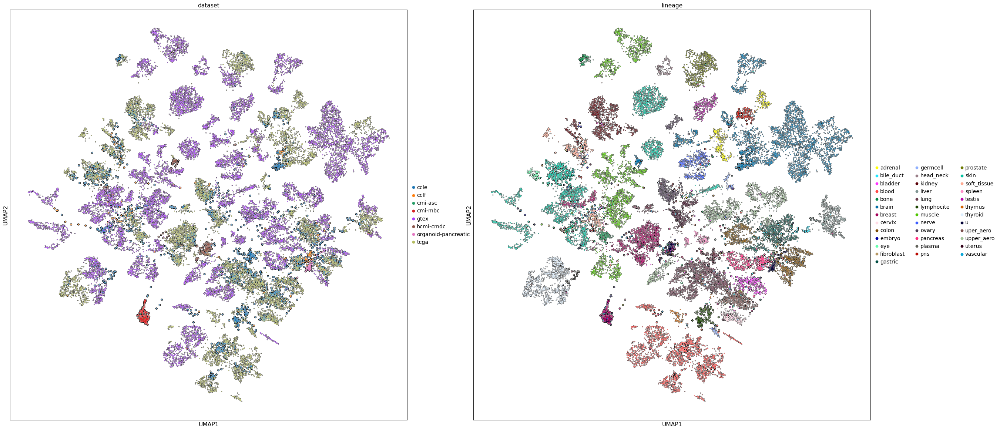

In [100]:
evaluator.plot_latent(umap_kwargs=dict( 
                            n_components=2,
                            min_dist=.5,
                            alpha=1,
                            spread=1,
                            random_state=None),
                    color=['dataset','lineage'],
                    projection="2d",
                    n_neighbors = 8,
                    #rerun=False,
                    add_outline = True,
                    size = [10 if val in ['tcga', 'gtex'] else 40 for val in evaluator.adata_latent.obs['dataset']]
                     )

In [103]:
from collections import Counter

In [ ]:
## is this issue with Breasts a data problem?

In [112]:
Counter(dataset[dataset.obs.dataset=='hcmi-cmdc'].obs.lineage)

Counter({'u': 115,
         'breast': 18,
         'brain': 50,
         'bile_duct': 2,
         'muscle': 3,
         'soft_tissue': 2,
         'gastric': 1,
         'colon': 4,
         'bone': 3,
         'kidney': 1,
         'thyroid': 1})

In [109]:
breasts = dataset[dataset.obs.lineage=='breast']

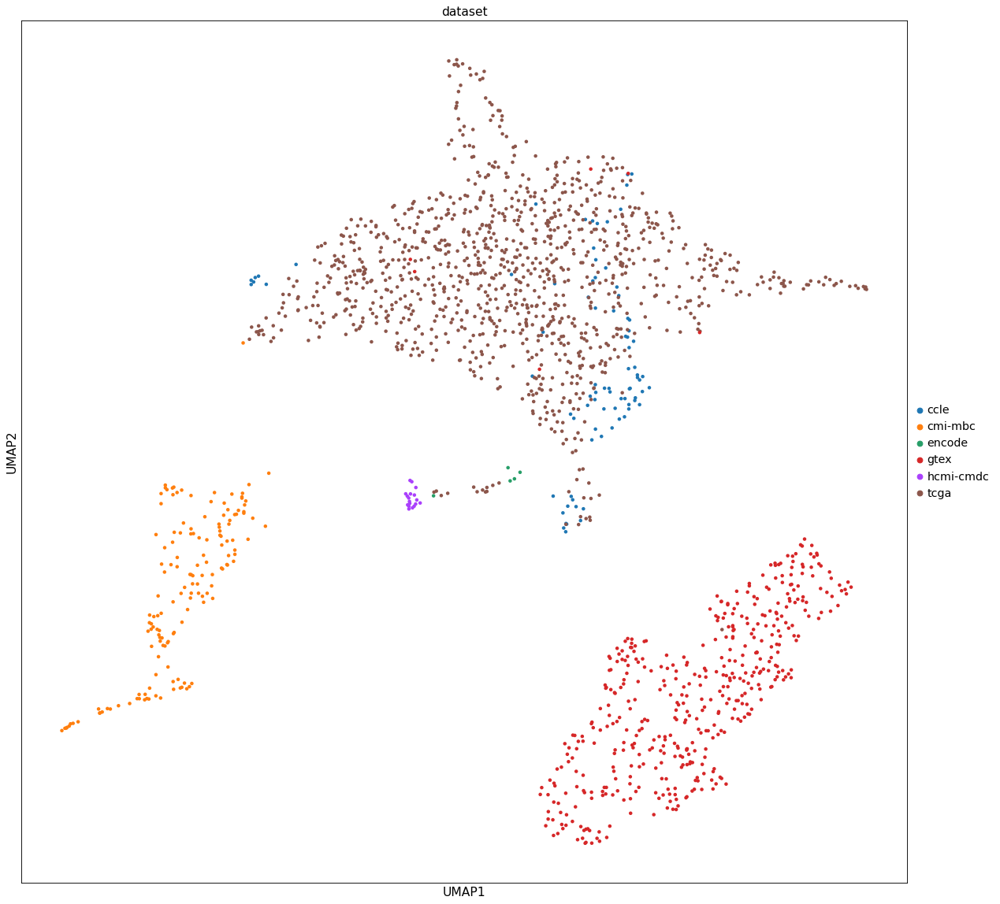

In [111]:
sc.pp.neighbors(breasts, n_neighbors=8)
sc.tl.leiden(breasts)
sc.tl.umap(breasts, n_components=2, min_dist=.5, alpha=1, spread=1, random_state=None)
sc.pl.umap(breasts, color=['dataset'], projection="2d")

In [107]:
Counter(dataset[dataset.obs.dataset=='cmi-asc'].obs.lineage)

Counter({'vascular': 7})

In [108]:
evaluator.get_class_quality(classes=['lineage', 'sex', 'age'], only=['cmi-mbc'], on="dataset")

lineage
all predicted categories:  {'bone', 'uterus', 'upper_aero', 'breast', 'muscle', 'blood', 'gastric', 'bile_duct', 'liver', 'ovary', 'skin'}
accuracy:  0.013157894736842105
F1 Score (weigthed): 0.00
F1 Score (macro): 0.00


sex
all predicted categories:  {'male', 'female'}
accuracy:  1.0
F1 Score (weigthed): 1.00
F1 Score (macro): 1.00


age
all predicted categories:  {'adult'}
accuracy:  1.0
F1 Score (weigthed): 1.00
F1 Score (macro): 1.00


use confusion matrix to get more details


In [101]:
evaluator.get_class_quality(classes=['lineage', 'sex', 'age'], only=['cclf', 'cmi-asc', 'cmi-mbc', 'hcmi-cmdc', 'organoid-pancreatic'], on="dataset")

lineage
all predicted categories:  {'colon', 'uterus', 'breast', 'blood', 'pancreas', 'brain', 'soft_tissue', 'embryo', 'bladder', 'lung', 'bile_duct', 'cervix', 'nerve', 'bone', 'germcell', 'upper_aero', 'muscle', 'uper_aero', 'kidney', 'liver', 'ovary', 'thyroid', 'skin', 'lymphocite', 'gastric', 'fibroblast'}
accuracy:  0.3010471204188482
F1 Score (weigthed): 0.31
F1 Score (macro): 0.24


sex
all predicted categories:  {'male', 'female'}
accuracy:  0.8860103626943006
F1 Score (weigthed): 0.89
F1 Score (macro): 0.88


age
all predicted categories:  {'pediatric', 'children', 'adult'}
accuracy:  0.9521276595744681
F1 Score (weigthed): 0.95
F1 Score (macro): 0.60


use confusion matrix to get more details


In [89]:
evaluator.get_class_quality(classes=['lineage', 'sex', 'age'], only=['cclf'], on="dataset")

lineage
all predicted categories:  {'colon', 'uterus', 'breast', 'blood', 'pancreas', 'brain', 'soft_tissue', 'embryo', 'bladder', 'lung', 'bile_duct', 'cervix', 'nerve', 'bone', 'germcell', 'upper_aero', 'uper_aero', 'kidney', 'liver', 'ovary', 'thyroid', 'skin', 'lymphocite', 'gastric', 'fibroblast'}
accuracy:  0.4420289855072464
F1 Score (weigthed): 0.44
F1 Score (macro): 0.27


sex
all predicted categories:  {'male', 'female'}
accuracy:  0.7322834645669292
F1 Score (weigthed): 0.73
F1 Score (macro): 0.73


age
all predicted categories:  {'pediatric', 'children', 'adult'}
accuracy:  0.7
F1 Score (weigthed): 0.61
F1 Score (macro): 0.49


use confusion matrix to get more details


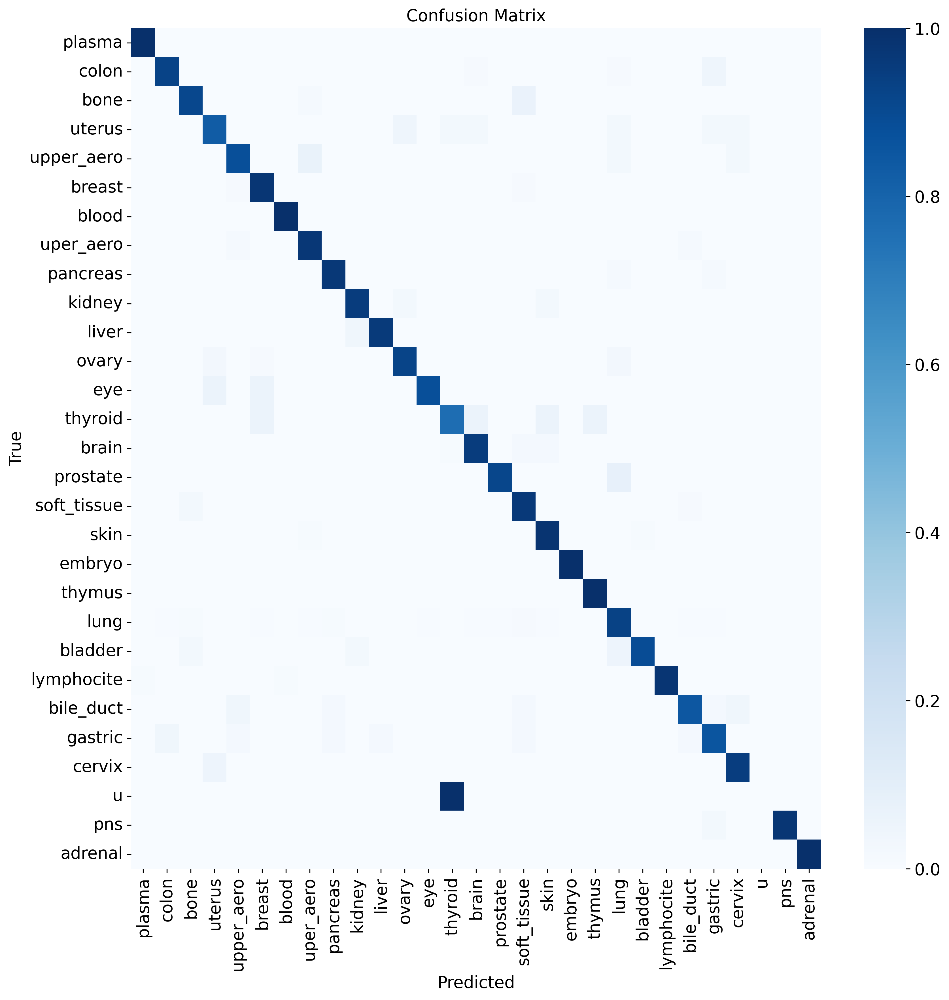

In [91]:
conf = evaluator.get_confusion_matrix(of="lineage", only='ccle', on='dataset', figsize=(13,13))

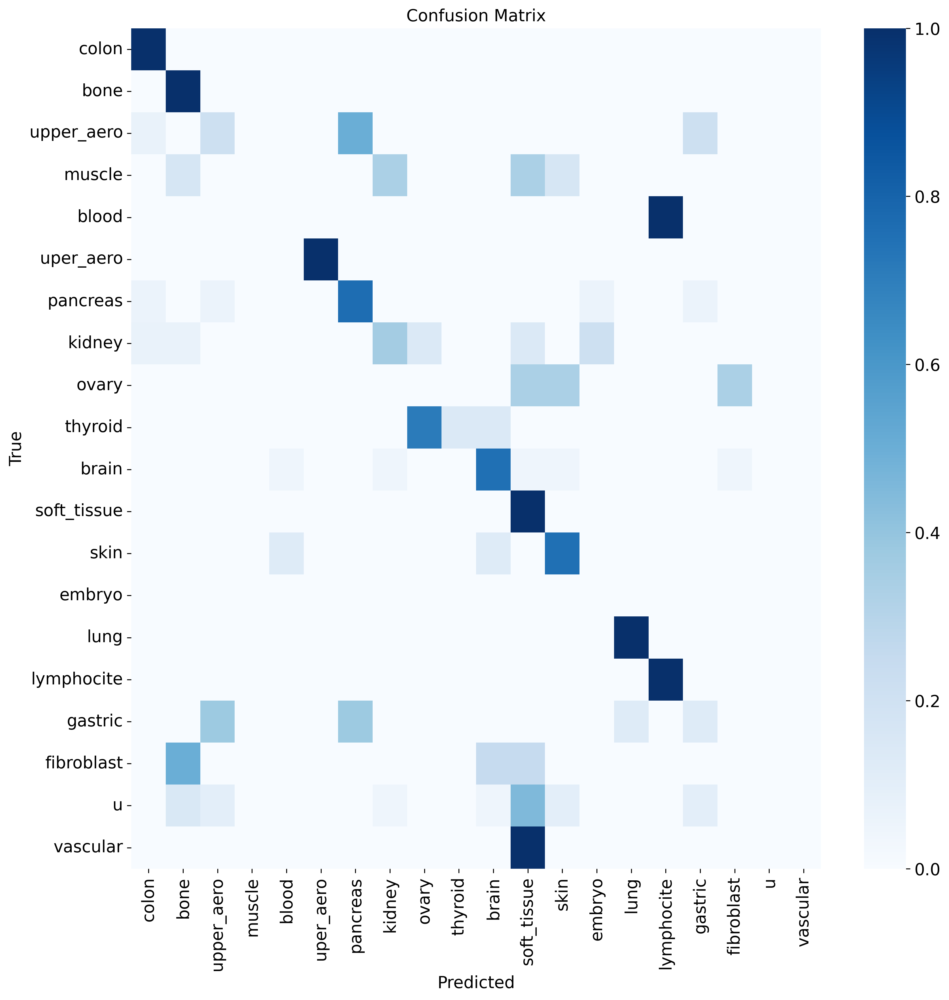

In [90]:
conf = evaluator.get_confusion_matrix(of="lineage", only='cclf', on='dataset', figsize=(13,13))

In [ ]:
cl2n.save("temp/gtex_tcga_ccle")

/home/jeremie/miniconda3/envs/gae/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'lineage_pred' as categorical
/home/jeremie/miniconda3/envs/gae/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'age_pred' as categorical
/home/jeremie/miniconda3/envs/gae/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed

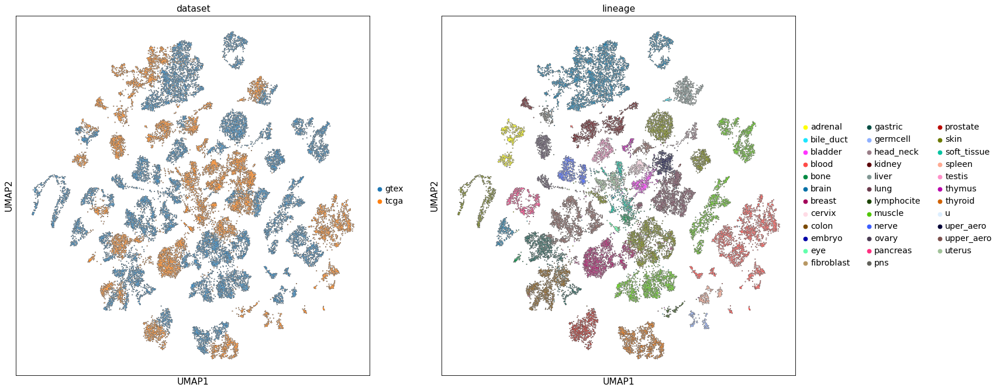

In [12]:
evaluator.plot_latent(umap_kwargs=dict( 
                            n_components=2,
                            min_dist=.5,
                            alpha=1,
                            spread=1,
                            random_state=None),
                    color=['dataset','lineage'],
                    projection="2d",
                    n_neighbors = 8,
                    #rerun=False,
                    add_outline = True,
                    #size = [30 if val != 'tcga' else 10 for val in evaluator.adata_latent.obs['dataset']]
                     )

In [13]:
cl2n.save("temp/target_gtex_tcga")

> /home/jeremie/celligner2/celligner2/othermodels/base/_base.py(36)_get_user_attributes()
     34 
     35         pdb.set_trace()
---> 36         attributes = inspect.getmembers(self, lambda a: not (inspect.isroutine(a)))
     37         attributes = [
     38             a for a in attributes if not (a[0].startswith("__") and a[0].endswith("__"))

ipdb> c


### the predictions

In [16]:
evaluator.get_class_quality(classes=['lineage', 'sex', 'age'])#only=['hcmi', 'met500'], on="dataset")

lineage
all predicted categories:  {'breast', 'uterus', 'bone', 'uper_aero', 'blood', 'ovary', 'head_neck', 'kidney', 'u', 'lymphocite', 'germcell', 'upper_aero', 'pancreas', 'muscle', 'skin', 'eye', 'gastric', 'testis', 'soft_tissue', 'liver', 'spleen', 'colon', 'thyroid', 'bladder', 'nerve', 'adrenal', 'cervix', 'bile_duct', 'brain', 'fibroblast', 'thymus', 'lung', 'pns', 'prostate', 'embryo'}
accuracy:  0.9931497738760309
F1 Score (weigthed): 0.99
F1 Score (macro): 0.98


sex
all predicted categories:  {'male', 'u', 'female'}
accuracy:  0.9930167597765364
F1 Score (weigthed): 0.99
F1 Score (macro): 0.98


age
all predicted categories:  {'u', 'pediatric', 'children', 'adult'}
accuracy:  0.9890928438414472
F1 Score (weigthed): 0.99
F1 Score (macro): 0.92


use confusion matrix to get more details


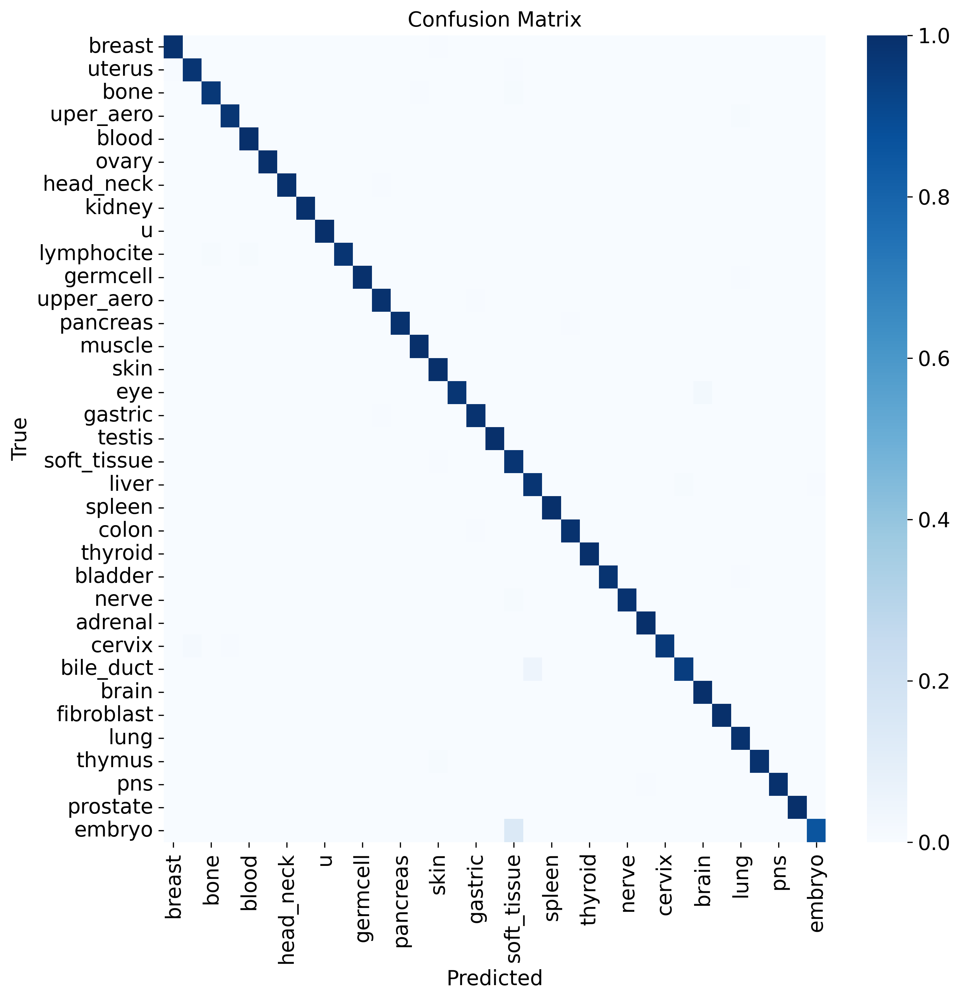

In [17]:
conf = evaluator.get_confusion_matrix(of="lineage", figsize=(10,10))

In [39]:
cl2n = celligner2.CELLIGNER2.load_query_data(adata=tosend, reference_model='temp/gtex_tcga_ccle', freeze=False, freeze_expression=False)

AnnData object with n_obs × n_vars = 31667 × 5000
    obs: 'disease_type', 'dataset', 'participant_id', 'disease_subtype', 'collection_site', 'doublingt', 'hasebv', 'instability', 'ethnicity', 'morphology', 'sample_name', 'age', 'base_media', 'sex', 'sequencer', 'sample_type', 'tissue_id', 'lineage', 'autolysis_score', 'rin', 'cell_format', 'passage_number', 'assay', 'history', 'contamination', 'leiden'
dict_keys(['apply_log_', 'beta_', 'betaclass_', 'classifier_hidden_layer_sizes_', 'condition_keys_', 'condition_set_', 'conditions_', 'dr_rate_', 'hidden_layer_sizes_', 'hsic_one_vs_all_', 'input_dim_', 'is_trained_', 'latent_dim_', 'main_dataset_', 'mask_', 'miss_', 'mmd_boundary_', 'mmd_on_', 'n_unconstrained_', 'predictor_keys_', 'predictor_set_', 'predictors_', 'recon_loss_', 'soft_mask_', 'use_bn_', 'use_hsic_', 'use_ln_', 'use_mmd_', 'use_own_kl_'])
main dataset not in conditions, removing..

INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and con

In [96]:
cl2.model.beta = 500
cl2.model.main_dataset="tcga"

In [97]:
cl2.train(
    n_epochs=200,
    alpha_epoch_anneal=200,
    cell_type_key='lineage',
    early_stopping_kwargs={
        "early_stopping_metric": "val_unweighted_loss",
        "threshold": 0,
        "patience": 20,
        "reduce_lr": True,
        "lr_patience": 13,
        "lr_factor": 0.1,
    },
    batch_size=200,
)

/home/jeremie/celligner2/celligner2/dataset/celligner2/anndata.py:53: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.goodloc = torch.tensor(goodloc, dtype=torch.bool)


 |████----------------| 22.0%  - val_loss: 41292.6131036932 - val_recon_loss: 38736.8275923295 - val_kl_loss: 99.9862799211 - val_class_ce_loss: 310.5555111278 - val_mmd_loss: 2245.2068800493
ADJUSTED LR
 |█████---------------| 25.5%  - val_loss: 41265.7272727273 - val_recon_loss: 38735.2324218750 - val_kl_loss: 99.9880228910 - val_class_ce_loss: 310.2882107821 - val_mmd_loss: 2220.1830915971
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 29


### other (@previous runs)

/home/jeremie/miniconda3/envs/gae/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'lineage_pred' as categorical
/home/jeremie/miniconda3/envs/gae/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'age_pred' as categorical
/home/jeremie/miniconda3/envs/gae/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed

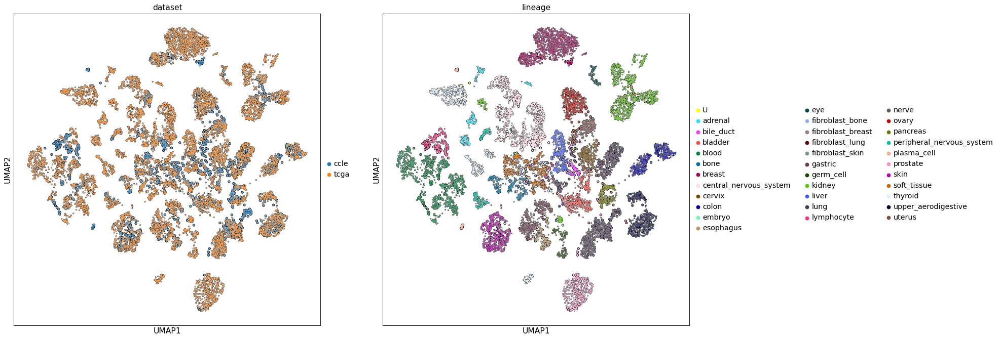

In [119]:
evaluator.plot_latent(umap_kwargs=dict( 
                            n_components=2,
                            min_dist=.5,
                            alpha=1,
                            spread=1,
                            random_state=None),
                    color=['dataset','lineage'],
                    projection="2d",
                    n_neighbors = 8,
                    rerun=True,
                    add_outline = True,
                    size = [30 if val != 'tcga' else 10 for val in evaluator.adata_latent.obs['dataset']])

In [34]:
sub = dataset[dataset.obs.dataset.isin(['hcmi', 'met500', 'cclf'])]

In [19]:
cl2.predictor_set_

NameError: name 'cl2' is not defined

In [41]:
cl2.predictor_set_ = {
                    key: set(tosend.obs[key]) - set(cl2.miss_) for key in cl2.predictor_keys_
                }

In [42]:
evaluator = pl.CELLIGNER2_EVAL(cl2)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


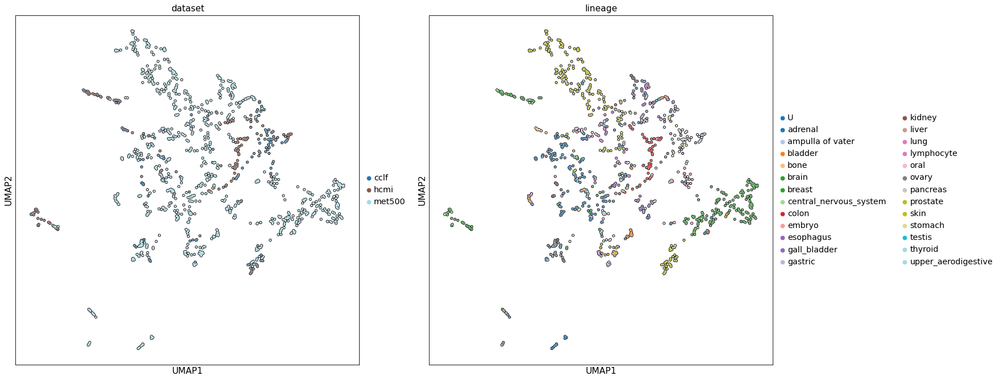

In [146]:
evaluator.plot_latent(umap_kwargs=dict( 
                            n_components=2,
                            min_dist=.3,
                            alpha=1,
                            spread=1,
                            random_state=None),
                    color=['dataset','lineage'],
                    projection="2d",
                    n_neighbors = 5,
                    rerun=False,
                    palette='tab20',
                    add_outline = True,
                    size = [30 if val != 'tcga' else 10 for val in evaluator.adata_latent.obs['dataset']])

In [43]:
evaluator = pl.CELLIGNER2_EVAL(cl2, additional_adata=tosend)#tosend = tosend[~tosend.obs.dataset.isin(['pediatric_PDX', 'hcmi', 'met500', 'cclf'])]

In [163]:
sc.settings.set_figure_params(dpi=800, frameon=False)
sc.set_figure_params(dpi=800)
sc.set_figure_params(figsize=(24, 24))

In [83]:
dataset.obs[dataset.obs.dataset=='hcmi'].iloc[0]

collection_site               pancreatic_head
disease_type       adenocarcinoma_ductal_type
doublingt                                   U
method                                   bulk
reference                                hg38
age                                     Adult
ends                               paired end
sequencer                 Illumina HiSeq 4000
participant_id              HCM-CSHL-0092-C25
sex                                      male
base_media                                  U
morphology                                 3D
dataset                                  hcmi
ethnicity                                   U
instability                                 U
hasebv                                      U
tissue_id                                   U
sample_type                             model
align                                    none
counter                                 HTSEQ
passage_number                              U
contamination                     

In [79]:
set(dataset.obs[dataset.obs.dataset=='hcmi'].sample_type)

{'model', 'tissue'}

In [88]:
evaluator.adata_latent.o

AnnData object with n_obs × n_vars = 14692 × 16
    obs: 'dataset', 'lineage', 'age', 'sex', 'lineage_pred', 'age_pred', 'sex_pred', 'tissue_type', 'cell_type', 'leiden'
    uns: 'neighbors', 'leiden', 'umap', 'dataset_colors', 'lineage_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [ ]:
from celligner.params import TISSUE_COLOR

In [ ]:
plot.scatter(evaluator.adata_latent.obsm.X_umap, labels={i: for i, v in evaluator.adata_latent.obs[['lineage', 'dataset', 'disease_type']].T.iterrows()} colors=TISSUE_COLOR

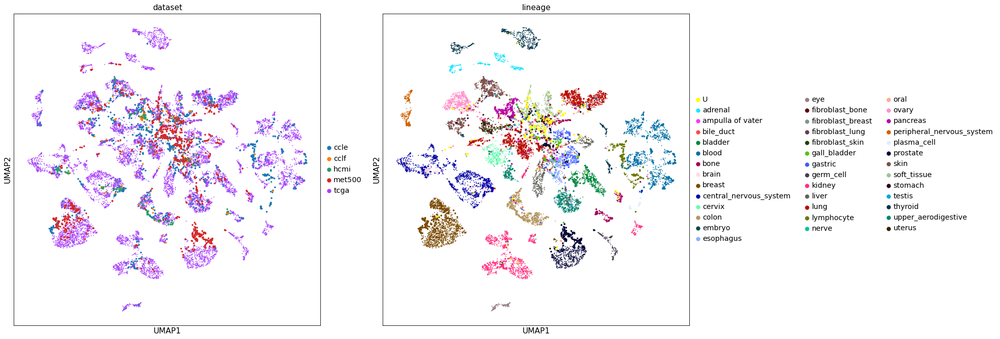

In [87]:
evaluator.plot_latent(umap_kwargs=dict( 
                            n_components=2,
                            min_dist=.4,
                            alpha=1,
                            spread=1,
                            random_state=None),
                    color=['dataset','lineage'],
                    projection="2d",
                    n_neighbors = 7,
                    #palette='tab20',
                    add_outline = False,
                    size = [40 if val != 'tcga' else 10 for val in evaluator.adata_latent.obs['dataset']])

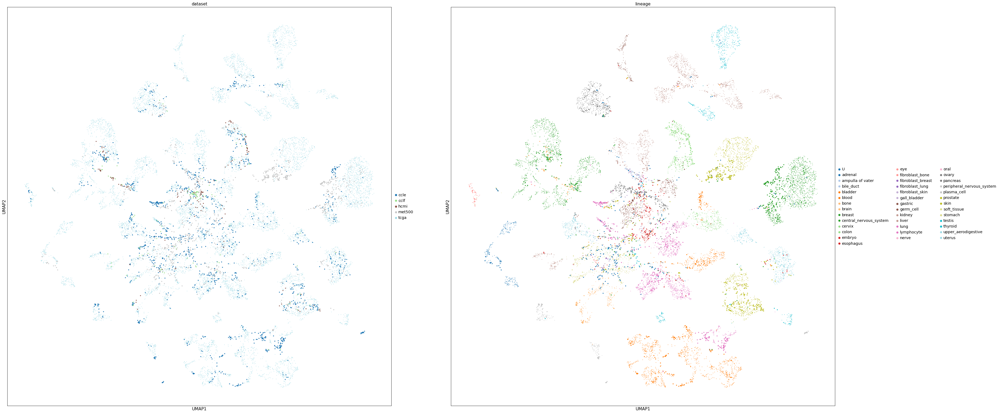

In [165]:
evaluator.plot_latent(umap_kwargs=dict( 
                            n_components=2,
                            min_dist=.4,
                            alpha=1,
                            spread=1,
                            random_state=None),
                    color=['dataset','lineage'],
                    projection="2d",
                    n_neighbors = 7,
                    rerun=False,
                    #palette='tab20',
                    add_outline = False,
                    size = [40 if val != 'tcga' else 10 for val in evaluator.adata_latent.obs['dataset']])

In [44]:
import scib

In [45]:
adata_obs = read_h5ad('../celligner/temp/adata.h5ad.gz').obs

In [46]:
evaluator.adata_latent.obs.loc[set(adata_obs.index) & set(evaluator.adata_latent.obs.index),['tissue_type','cell_type']] = adata_obs.loc[set(adata_obs.index) & set(evaluator.adata_latent.obs.index), ['tissue_type','cell_type']]

In [48]:
dataset.obs.drop(columns=['cell_type'], inplace=True)

In [49]:
dataset.obs.loc[set(adata_obs.index) & set(evaluator.adata_latent.obs.index),['tissue_type','cell_type']] = adata_obs.loc[set(adata_obs.index) & set(evaluator.adata_latent.obs.index), ['tissue_type','cell_type']]

In [50]:
loc = ~evaluator.adata_latent.obs.cell_type.isna()

In [57]:
dataset[evaluator.adata_latent[loc].obs.index]

View of AnnData object with n_obs × n_vars = 14418 × 3000
    obs: 'collection_site', 'disease_type', 'doublingt', 'method', 'reference', 'age', 'ends', 'sequencer', 'participant_id', 'sex', 'base_media', 'morphology', 'dataset', 'ethnicity', 'instability', 'hasebv', 'tissue_id', 'sample_type', 'align', 'counter', 'passage_number', 'contamination', 'lineage', 'stage', 'conservation', 'cell_format', 'tissue_type', 'cell_type'

In [58]:
evaluator.adata_latent[loc]

View of AnnData object with n_obs × n_vars = 14418 × 16
    obs: 'dataset', 'lineage', 'age', 'sex', 'lineage_pred', 'age_pred', 'sex_pred', 'tissue_type', 'cell_type'

In [60]:
evaluator.adata_latent.obsm

AxisArrays with keys: 

In [59]:
dataset.obsm.obs

AxisArrays with keys: 

In [65]:
dataset.obs.cell_type = dataset.obs.cell_type.astype('category')
dataset.obs.tissue_type = dataset.obs.tissue_type.astype('category')
evaluator.adata_latent.obs.cell_type = evaluator.adata_latent.obs.cell_type.astype('category')
evaluator.adata_latent.obs.tissue_type = evaluator.adata_latent.obs.tissue_type.astype('category')

In [71]:
evaluator.adata_latent.obsm['X_pca'] = evaluator.adata_latent.X

ValueError: Value passed for key 'X_pca' is of incorrect shape. Values of obsm must match dimensions (0,) of parent. Value had shape (14418, 16) while it should have had (14692,).

In [72]:
scib.metrics.metrics(dataset[evaluator.adata_latent[loc].obs.index], evaluator.adata_latent[loc], batch_key="cell_type", label_key='tissue_type', cell_cycle_=False, organism='human', trajectory_=False, isolated_labels_asw_=True, silhouette_=True, hvg_score_=False, graph_conn_=True, pcr_=True, isolated_labels_f1_=False, nmi_=True, ari_=True, kBET_=True, ilisi_=True, clisi_=True,)

NMI...
ARI...
Silhouette score...
PC regression...
Isolated labels ASW...
Graph connectivity...
kBET...
cLISI score...
/tmp/lisi_f_sfja7t/input.mtx /tmp/lisi_f_sfja7t/
iLISI score...
/tmp/lisi_90rg02kf/input.mtx /tmp/lisi_90rg02kf/


,0
NMI_cluster/label,0.831564
ARI_cluster/label,0.701115
ASW_label,0.560188
ASW_label/batch,0.845711
PCR_batch,0.926795
cell_cycle_conservation,NaN
isolated_label_F1,NaN
isolated_label_silhouette,0.482754
graph_conn,0.834280
kBET,NaN
